In [46]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt

In [47]:
#please include actual path of the audio file.
example_file = "pop.00094.wav"

In [48]:
# load audio file with Librosa
signal, sample_rate = librosa.load(example_file)
print(f'signal : {signal}')
print(f"sample_rate : {sample_rate}")

signal : [ 0.20877075  0.05661011  0.1496582  ... -0.15530396  0.04458618
  0.0536499 ]
sample_rate : 22050


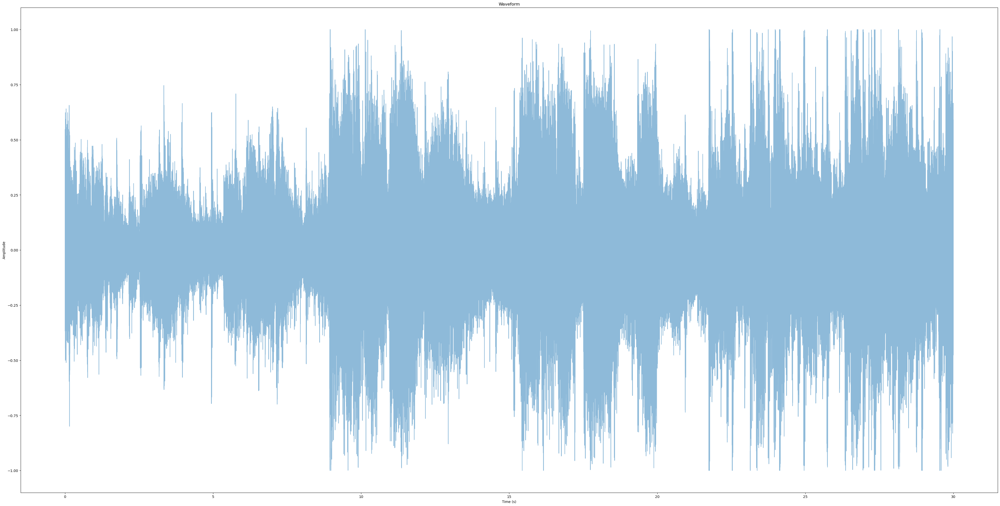

In [49]:
FIG_SIZE = (50,25)

# Create time axis
duration = len(signal) / sample_rate
time = np.linspace(0, duration, len(signal))

# Plot the waveform
plt.figure(figsize=FIG_SIZE)
plt.plot(time, signal, alpha=0.5)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Waveform")
plt.show()

In [50]:
# Fourier Transform (FFT) - Frequency Domain
fft = np.fft.fft(signal)
print(fft)

[-14.1340332  +0.j          -0.53263129-35.94446409j
  42.15592392 -6.15448286j ...  18.22993174-31.01765956j
  42.15592392 +6.15448286j  -0.53263129+35.94446409j]


In [51]:
# Calculate the Magnitude (abs values on complex numbers)
spectrum = np.abs(fft)
print(spectrum)

[14.1340332  35.94841019 42.60281189 ... 35.97812691 42.60281189
 35.94841019]


In [52]:
# Create the Frequency variable
f = np.linspace(0, sample_rate, len(spectrum))
print(f)

[0.00000000e+00 3.33331822e-02 6.66663643e-02 ... 2.20499333e+04
 2.20499667e+04 2.20500000e+04]


Text(0.5, 1.0, 'Power Spectrum')

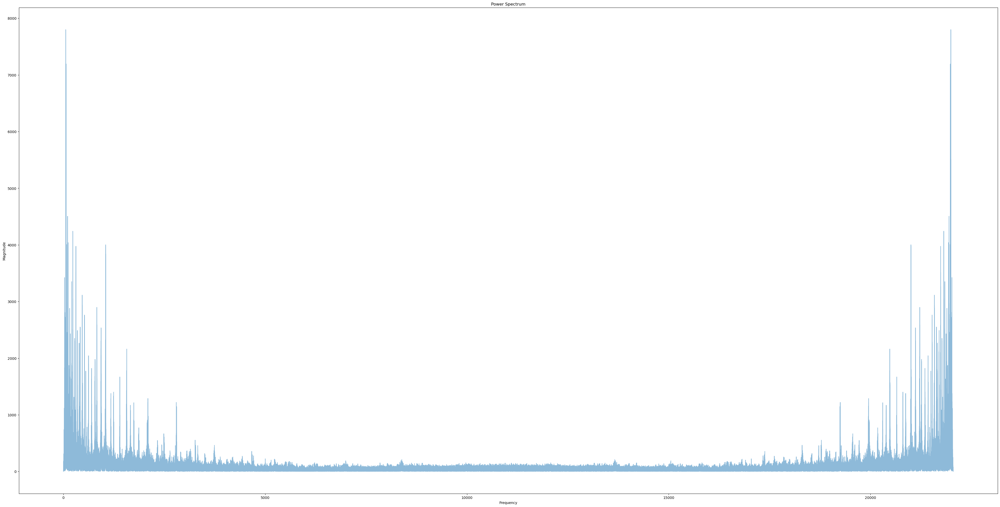

In [53]:
# Plot Spectrum
plt.figure(figsize=FIG_SIZE)
plt.plot(f, spectrum, alpha=0.5)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.title("Power Spectrum")

In [54]:
# Take half of the spectrum and frequency
left_spectrum = spectrum[:int(len(spectrum)/2)]
print(left_spectrum)
left_f = f[:int(len(spectrum)/2)]
print(left_f)

[14.1340332  35.94841019 42.60281189 ... 80.03379327 72.53696057
 16.34640413]
[0.00000000e+00 3.33331822e-02 6.66663643e-02 ... 1.10249167e+04
 1.10249500e+04 1.10249833e+04]


Text(0.5, 1.0, 'Power Spectrum')

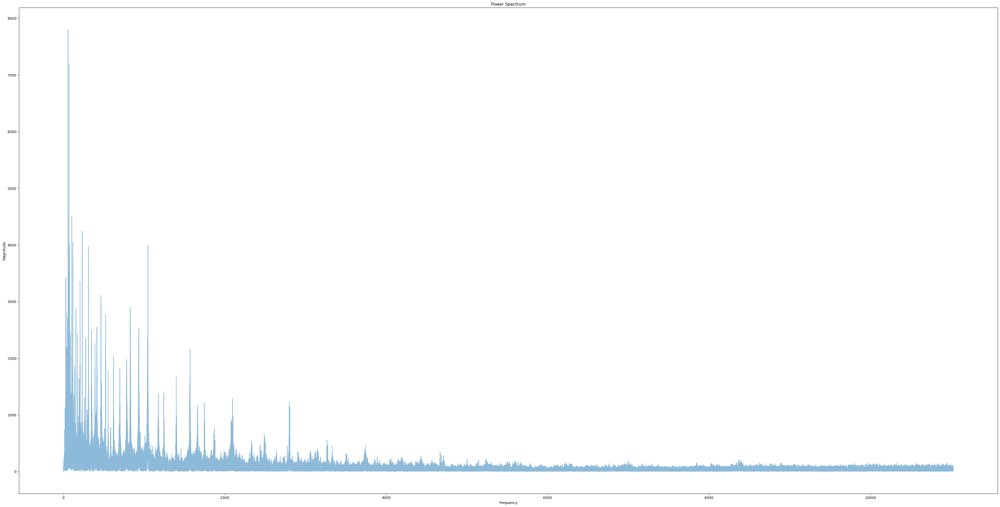

In [55]:
# Plot Spectrum
plt.figure(figsize=FIG_SIZE)
plt.plot(left_f, left_spectrum, alpha=0.5)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.title("Power Spectrum")

In [56]:
# Spectrogram Short-time Fourier transform (STFT).
hop_length = 512 # num. of samples
n_fft = 2048 # num. of samples for window

In [57]:
# Perform Short-time Fourier transform (STFT).
stft = librosa.stft(signal, n_fft=n_fft, hop_length=hop_length)
print(stft)

[[ -1.798252  +0.j          -0.39980802+0.j
    0.42326108+0.j         ...   1.874552  +0.j
    7.7012267 +0.j          15.539551  +0.j        ]
 [  1.4321424 -0.0952318j    0.7318649 +1.5399965j
   -1.731317  -0.76844656j ...  -5.89499   +0.53504306j
    5.329565  +5.713981j   -19.31055   +2.4518344j ]
 [ -1.9155389 -0.57465285j  -1.2205582 +1.4893007j
    4.9876304 +0.37191463j ...   6.375137  -8.261838j
  -24.392084  +7.853928j    28.605947  +5.3131623j ]
 ...
 [  0.15330817-0.2125517j    1.0043787 +1.8163749j
   -1.2764875 -2.4258723j  ...   1.4686692 +5.637762j
   -2.6056247 -2.523363j     0.63016254-0.4065769j ]
 [ -0.20876636-0.62487733j  -2.011145  -0.42727512j
    0.29199684+1.8630288j  ...  -2.3624988 -0.8098218j
   -1.2882345 +2.5351489j    0.05048595+0.16342808j]
 [  1.0763127 +0.j           2.1017828 +0.j
    0.7410521 +0.j         ...   4.7193565 +0.j
    2.847928  +0.j           0.22267202+0.j        ]]


In [58]:
# Calculate the Magnitude (abs values on complex numbers)
spectrogram = np.abs(stft)
print(spectrogram)

[[ 1.798252    0.39980802  0.42326108 ...  1.874552    7.7012267
  15.539551  ]
 [ 1.4353052   1.705056    1.8941935  ...  5.919221    7.813696
  19.465582  ]
 [ 1.9998789   1.9255593   5.0014772  ... 10.435533   25.62534
  29.095186  ]
 ...
 [ 0.26207176  2.0755708   2.741218   ...  5.8259206   3.6272085
   0.74993974]
 [ 0.65882856  2.0560322   1.8857726  ...  2.497441    2.843682
   0.17104845]
 [ 1.0763127   2.1017828   0.7410521  ...  4.7193565   2.847928
   0.22267202]]


Text(0.5, 1.0, 'Spectrogram')

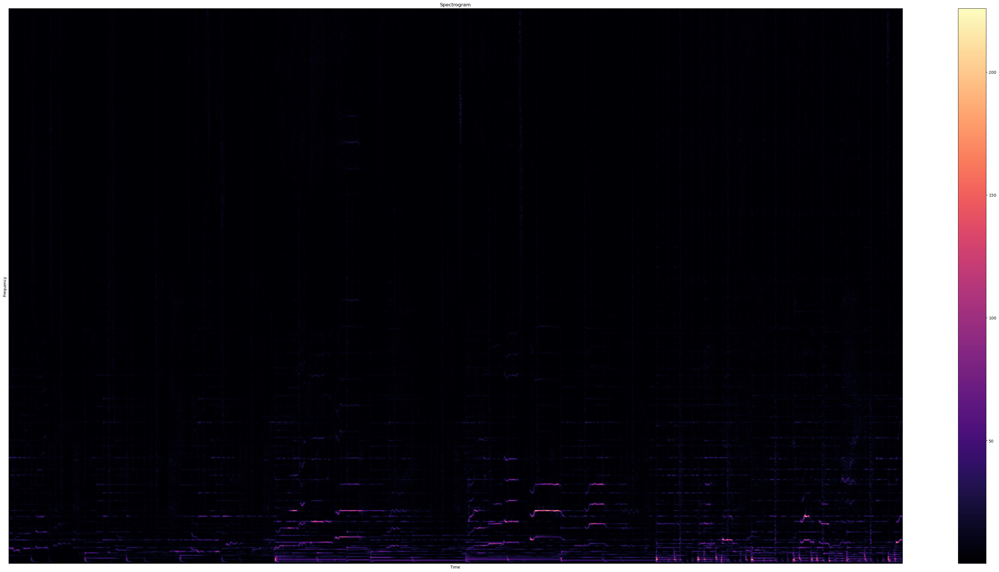

In [59]:
# Plot the Spectrogram
plt.figure(figsize=FIG_SIZE)
librosa.display.specshow(spectrogram, sr=sample_rate, hop_length=hop_length)
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar()
plt.title("Spectrogram")

In [60]:
# Apply Logarithm to get values in Decibels
log_spectrogram = librosa.amplitude_to_db(spectrogram)

Text(0.5, 1.0, 'Spectrogram (dB)')

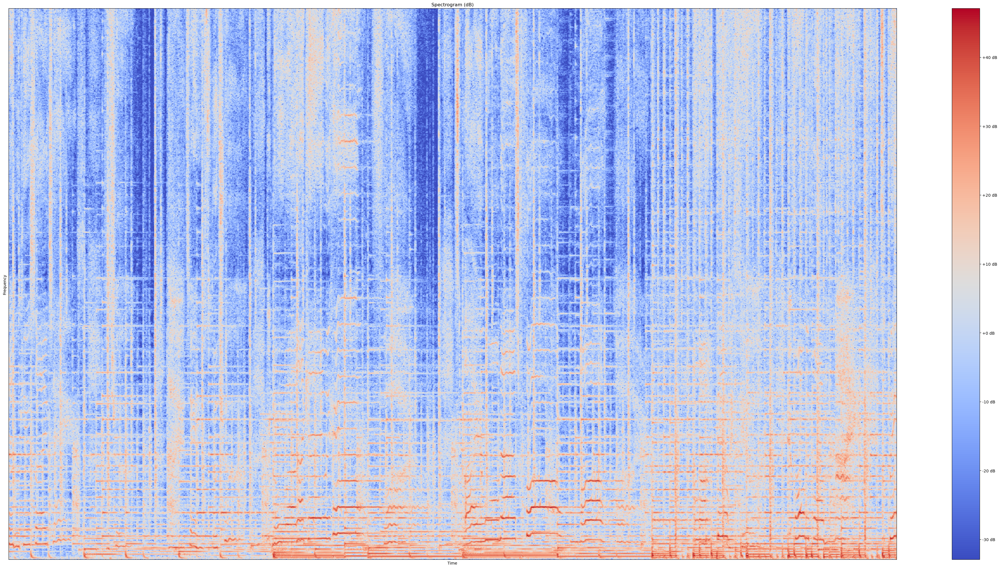

In [61]:
# Plot the Spectrogram in Decibels
plt.figure(figsize=FIG_SIZE)
librosa.display.specshow(log_spectrogram, sr=sample_rate, hop_length=hop_length)
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar(format="%+2.0f dB")
plt.title("Spectrogram (dB)")

In [62]:
# Mel-frequency cepstral coefficients (MFCCs) (we use 13 MFCCs)
MFCCs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_fft=n_fft, hop_length=hop_length, n_mfcc=13)
print(MFCCs)

[[-53.543716   -36.360336   -47.43735    ...  39.989586    27.479424
   -6.9113784 ]
 [ 77.3613      66.39235     57.846268   ...  54.19596     54.099632
   67.65075   ]
 [ -8.484987    -7.68616     -5.024858   ...  18.511108    25.223408
   23.173626  ]
 ...
 [-11.924389   -15.244072   -17.665188   ...  -0.97726583  -6.458118
   -6.718588  ]
 [ -5.2740655   -5.2878876   -4.4269466  ... -11.750804   -12.166962
  -10.62888   ]
 [  2.7898052    7.299697     4.11316    ...  -0.21433687   1.9718941
    2.7071743 ]]


Text(0.5, 1.0, 'MFCCs')

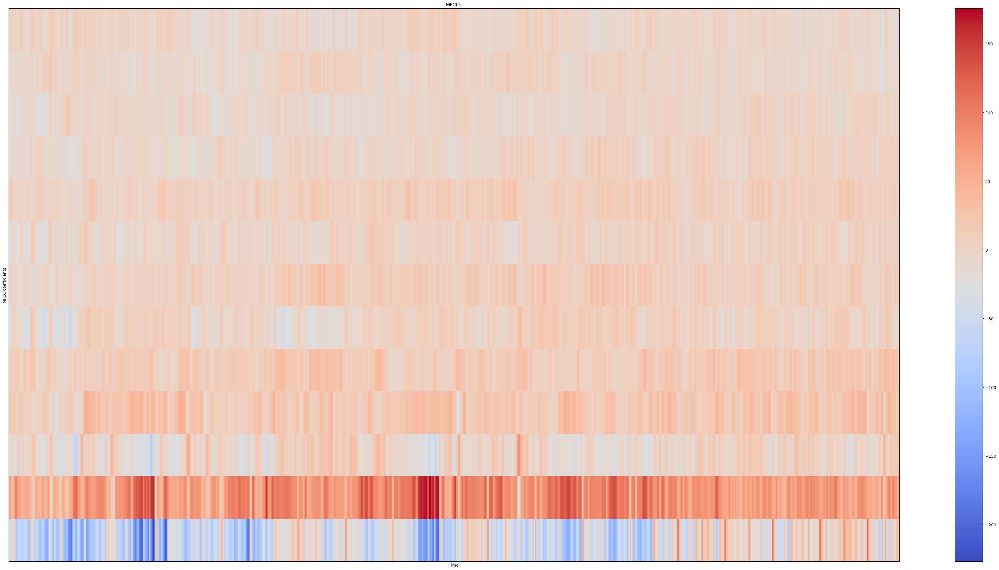

In [63]:
# Plot MFCCs
plt.figure(figsize=FIG_SIZE)
librosa.display.specshow(MFCCs, sr=sample_rate, hop_length=hop_length)
plt.xlabel("Time")
plt.ylabel("MFCC coefficients")
plt.colorbar()
plt.title("MFCCs")

In [64]:
import json
import os
import math

In [65]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("andradaolteanu/gtzan-dataset-music-genre-classification")

In [66]:
DATASET_PATH = r"C:\Users\msuma\.cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original"
JSON_PATH = "data_10.json"
SAMPLE_RATE = 22050
TRACK_DURATION = 30 # measured in seconds
SAMPLES_PER_TRACK = SAMPLE_RATE * TRACK_DURATION

In [67]:
import json
import os
import math
import librosa
import audioread

# ...

def save_mfcc(dataset_path, json_path, num_mfcc=13, n_fft=2048, hop_length=512, num_segments=5):
    data = {
        "mapping": [],
        "labels": [],
        "mfcc": []
    }

    samples_per_segment = int(SAMPLES_PER_TRACK / num_segments)
    num_mfcc_vectors_per_segment = math.ceil(samples_per_segment / hop_length)

    for i, (dirpath, dirnames, filenames) in enumerate(os.walk(dataset_path)):
        if dirpath is not dataset_path:
            semantic_label = dirpath.split("/")[-1]
            data["mapping"].append(semantic_label)
            print("\nProcessing: {}".format(semantic_label))

            for f in filenames:
                try:
                    file_path = os.path.join(dirpath, f)
                    signal, sample_rate = librosa.load(file_path, sr=SAMPLE_RATE)

                    for d in range(num_segments):
                        start = samples_per_segment * d
                        finish = start + samples_per_segment

                        mfcc = librosa.feature.mfcc(y=signal[start:finish], sr=sample_rate, n_mfcc=num_mfcc, n_fft=n_fft, hop_length=hop_length)
                        mfcc = mfcc.T

                        if len(mfcc) == num_mfcc_vectors_per_segment:
                            data["mfcc"].append(mfcc.tolist())
                            data["labels"].append(i-1)
                            print("{}, segment:{}".format(file_path, d+1))

                except (librosa.LibrosaError, audioread.NoBackendError, OSError) as e:
                    print("Error processing {}: {}".format(file_path, str(e)))

    with open(json_path, "w") as fp:
        json.dump(data, fp, indent=4)

In [68]:
save_mfcc(DATASET_PATH, JSON_PATH, num_segments=10)


Processing: C:\Users\msuma\.cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\blues
C:\Users\msuma\.cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\blues\blues.00000.wav, segment:1
C:\Users\msuma\.cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\blues\blues.00000.wav, segment:2
C:\Users\msuma\.cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\blues\blues.00000.wav, segment:3
C:\Users\msuma\.cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\blues\blues.00000.wav, segment:4
C:\Users\msuma\.cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\blues\blues.00000.wav, segment:5
C:\Users\msuma\.cache\kagglehub\datasets\a

C:\Users\msuma\AppData\Local\Temp\ipykernel_14556\2353940116.py:28: UserWarning: PySoundFile failed. Trying audioread instead.
  signal, sample_rate = librosa.load(file_path, sr=SAMPLE_RATE)
C:\Users\msuma\anaconda3\Lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


C:\Users\msuma\.cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\jazz\jazz.00056.wav, segment:8
C:\Users\msuma\.cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\jazz\jazz.00056.wav, segment:9
C:\Users\msuma\.cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\jazz\jazz.00056.wav, segment:10
C:\Users\msuma\.cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\jazz\jazz.00057.wav, segment:1
C:\Users\msuma\.cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\jazz\jazz.00057.wav, segment:2
C:\Users\msuma\.cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\jazz\jazz.00057.wav, segment:3
C:\Users\msuma\.cache\kagglehub\dataset

In [69]:
import json
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as keras

import matplotlib.pyplot as plt
import random

import librosa
import math

In [70]:
DATA_PATH = "data_10.json"

In [71]:
def load_data(data_path):

    with open(data_path, "r") as f:
        data = json.load(f)

    # convert lists to numpy arrays
    X = np.array(data["mfcc"])
    y = np.array(data["labels"])

    print("Data succesfully loaded!")

    return  X, y

In [72]:
# load data
X, y = load_data(DATA_PATH)

Data succesfully loaded!


In [73]:
X.shape

(9986, 130, 13)

In [74]:
# create train, validation and test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)
X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size=0.2)

# add an axis to input sets
X_train = X_train[..., np.newaxis]
X_validation = X_validation[..., np.newaxis]
X_test = X_test[..., np.newaxis]

PREPROCESSING STEP

In [76]:
for idx, mfcc in enumerate(X_train):
    print(f"Sample {idx} shape: {np.array(mfcc).shape}")


Sample 0 shape: (130, 13, 1)
Sample 1 shape: (130, 13, 1)
Sample 2 shape: (130, 13, 1)
Sample 3 shape: (130, 13, 1)
Sample 4 shape: (130, 13, 1)
Sample 5 shape: (130, 13, 1)
Sample 6 shape: (130, 13, 1)
Sample 7 shape: (130, 13, 1)
Sample 8 shape: (130, 13, 1)
Sample 9 shape: (130, 13, 1)
Sample 10 shape: (130, 13, 1)
Sample 11 shape: (130, 13, 1)
Sample 12 shape: (130, 13, 1)
Sample 13 shape: (130, 13, 1)
Sample 14 shape: (130, 13, 1)
Sample 15 shape: (130, 13, 1)
Sample 16 shape: (130, 13, 1)
Sample 17 shape: (130, 13, 1)
Sample 18 shape: (130, 13, 1)
Sample 19 shape: (130, 13, 1)
Sample 20 shape: (130, 13, 1)
Sample 21 shape: (130, 13, 1)
Sample 22 shape: (130, 13, 1)
Sample 23 shape: (130, 13, 1)
Sample 24 shape: (130, 13, 1)
Sample 25 shape: (130, 13, 1)
Sample 26 shape: (130, 13, 1)
Sample 27 shape: (130, 13, 1)
Sample 28 shape: (130, 13, 1)
Sample 29 shape: (130, 13, 1)
Sample 30 shape: (130, 13, 1)
Sample 31 shape: (130, 13, 1)
Sample 32 shape: (130, 13, 1)
Sample 33 shape: (13

In [77]:
import numpy as np
import tensorflow as tf
from tensorflow.image import resize

# Updated preprocessing function for your data format
# Updated preprocessing function with dynamic padding
import tensorflow as tf

def preprocess_mfccs(mfcc):
    # Ensure the input is a NumPy array
    mfcc = np.array(mfcc)

    # Remove any singleton dimensions
    mfcc = np.squeeze(mfcc)

    # Ensure the input is now 2D
    if mfcc.ndim != 2:
        raise ValueError(f"MFCC input must be 2D after squeezing, but got shape {mfcc.shape}")

    # Calculate the required padding
    target_height, target_width = 130, 130
    pad_height = max(0, target_height - mfcc.shape[0])
    pad_width = max(0, target_width - mfcc.shape[1])

    # Pad the MFCC array to match the target shape
    padded_mfcc = np.pad(mfcc, ((0, pad_height), (0, pad_width)), mode='constant')

    # Add a channel dimension (from [H, W] to [H, W, 1])
    padded_mfcc = np.expand_dims(padded_mfcc, axis=-1)

    # Resize to (224, 224) while preserving the single channel
    resized_mfcc = tf.image.resize(padded_mfcc, (224, 224))

    # Convert to RGB-like input by repeating the single channel 3 times
    rgb_input = tf.repeat(resized_mfcc, repeats=3, axis=-1)
    return rgb_input.numpy()



# Apply preprocessing to all training and test data
X_train_resized = np.array([preprocess_mfccs(x) for x in X_train])
X_test_resized = np.array([preprocess_mfccs(x) for x in X_test])

# Verify the output shapes
print(f"Resized training data shape: {X_train_resized.shape}")  # Should be (num_samples, 224, 224, 3)
print(f"Resized test data shape: {X_test_resized.shape}")


Resized training data shape: (5991, 224, 224, 3)
Resized test data shape: (2497, 224, 224, 3)


In [78]:
# Check the shape of the first processed sample
print(f"Processed shape of first sample: {X_train_resized[0].shape}")


Processed shape of first sample: (224, 224, 3)


USING PRETRAINED MODEL VGG16

In [80]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import numpy as np
# Load pre-trained VGG16 without the top classification layer
base_model = VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers (initially)
base_model.trainable = False

# Add custom layers for music genre classification
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Reduce feature maps to a single vector
x = Dense(256, activation='relu')(x)  # Larger dense layer for better learning
x = Dropout(0.5)(x)  # Add dropout for regularization
output = Dense(10, activation='softmax')(x)  # Output layer for 10 genres

# Create the final model
model = Model(inputs=base_model.input, outputs=output)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Print model summary
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         131,3

 Total params: 14,848,586 (56.64 MB)

 Trainable params: 133,898 (523.04 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

DATA AUGMENTATION

In [82]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,        # Randomly rotate images
    width_shift_range=0.2,    # Randomly shift images horizontally
    height_shift_range=0.2,   # Randomly shift images vertically
    zoom_range=0.2,           # Randomly zoom images
    horizontal_flip=True      # Randomly flip images horizontally
)

# Fit data augmentation generator on training data
datagen.fit(X_train_resized)


Train The Model

In [84]:
# Train the model
history = model.fit(
    datagen.flow(X_train_resized, y_train, batch_size=32),  # Use augmented data
    validation_data=(X_test_resized, y_test),
    epochs=10,  # Train for more epochs
    batch_size=32
)

# Evaluate the model
test_loss, test_accuracy = model.evaluate(X_test_resized, y_test)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")


C:\Users\msuma\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 1044s 6s/step - accuracy: 0.1148 - loss: 3.7654 - val_accuracy: 0.2046 - val_loss: 2.2872
Epoch 2/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 995s 5s/step - accuracy: 0.1646 - loss: 2.5091 - val_accuracy: 0.2195 - val_loss: 2.2232
Epoch 3/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 967s 5s/step - accuracy: 0.2045 - loss: 2.2530 - val_accuracy: 0.2347 - val_loss: 2.1309
Epoch 4/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 4686s 25s/step - accuracy: 0.2216 - loss: 2.1353 - val_accuracy: 0.2463 - val_loss: 2.0780
Epoch 5/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 11067s 59s/step - accuracy: 0.2385 - loss: 2.0920 - val_accuracy: 0.2407 - val_loss: 2.1026
Epoch 6/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 963s 5s/step - accuracy: 0.2401 - loss: 2.0659 - val_accuracy: 0.2535 - val_loss: 2.0645
Epoch 7/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 988s 5s/step - accuracy: 0.2620 - loss: 2.0207 - val_accuracy: 0.2591 - val_loss: 2.0226
Epoch 8/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 1004s 5s/step - accuracy: 0.2662 - loss: 2.0063 - v

After we successfully trained through VGG16 CNN architecture, we have added the custom DNN and CNN layers to improve the efficacy

In [93]:
# create train, validation and test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)
X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size=0.2)

# add an axis to input sets
X_train = X_train[..., np.newaxis]
X_validation = X_validation[..., np.newaxis]
X_test = X_test[..., np.newaxis]

In [94]:
X_train.shape

(5991, 130, 13, 1)

In [95]:
input_shape = (X_train.shape[1], X_train.shape[2], 1)

In [96]:
# build the CNN
model_cnn = keras.Sequential()

# 1st conv layer
model_cnn.add(keras.layers.Conv2D(64, (3, 3), activation='relu', input_shape=input_shape))
model_cnn.add(keras.layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same'))
model_cnn.add(keras.layers.BatchNormalization())

# 2nd conv layer
model_cnn.add(keras.layers.Conv2D(64, (3, 3), activation='relu'))
model_cnn.add(keras.layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same'))
model_cnn.add(keras.layers.BatchNormalization())

# 3rd conv layer
model_cnn.add(keras.layers.Conv2D(32, (2, 2), activation='relu'))
model_cnn.add(keras.layers.MaxPooling2D((2, 2), strides=(2, 2), padding='same'))
model_cnn.add(keras.layers.BatchNormalization())

# flatten output and feed it into dense layer
model_cnn.add(keras.layers.Flatten())
model_cnn.add(keras.layers.Dense(64, activation='relu'))
model_cnn.add(keras.layers.Dropout(0.3))

# output layer
model_cnn.add(keras.layers.Dense(10, activation='softmax'))

C:\Users\msuma\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [97]:
# compile model
optimiser = keras.optimizers.Adam(learning_rate=0.0001)
model_cnn.compile(optimizer=optimiser,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [98]:
model_cnn.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 128, 11, 64)         │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 64, 6, 64)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 6, 64)           │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 62, 4, 64)           │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 31, 2, 64)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 31, 2, 64)           │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 30, 1, 32)           │           8,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 15, 1, 32)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 15, 1, 32)           │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 480)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 64)                  │          30,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 10)                  │             650 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 77,866 (304.16 KB)

 Trainable params: 77,546 (302.91 KB)

 Non-trainable params: 320 (1.25 KB)

In [99]:
# train model
history = model_cnn.fit(X_train, y_train, validation_data=(X_validation, y_validation), batch_size=32, epochs=50)

Epoch 1/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.1927 - loss: 2.5738 - val_accuracy: 0.3712 - val_loss: 1.8133
Epoch 2/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.3800 - loss: 1.7749 - val_accuracy: 0.4793 - val_loss: 1.4785
Epoch 3/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - accuracy: 0.4571 - loss: 1.5390 - val_accuracy: 0.5234 - val_loss: 1.3387
Epoch 4/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.4819 - loss: 1.4668 - val_accuracy: 0.5521 - val_loss: 1.2578
Epoch 5/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.5132 - loss: 1.3541 - val_accuracy: 0.5567 - val_loss: 1.2252
Epoch 6/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5490 - loss: 1.2662 - val_accuracy: 0.5854 - val_loss: 1.1662
Epoch 7/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.5769 - loss: 1.1966 - val_accuracy: 0.5975 - val_loss: 1.1246
Epoch 8/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.5906 - loss: 1.1477 - val_accu

In [108]:
# evaluate model on Test Set
test_loss, test_acc = model_cnn.evaluate(X_test, y_test, verbose=2)
print('\nTest accuracy:', test_acc)

79/79 - 1s - 9ms/step - accuracy: 0.7517 - loss: 0.7734

Test accuracy: 0.751702070236206


In [109]:
model_cnn.save("Music_Genrel_CNN_Model.h5")

In [110]:
# It can be used to reconstruct the model identically.
reconstructed_model = keras.models.load_model("Music_Genrel_CNN_Model.h5")

In [111]:
# pick a sample to predict from the test set
X_to_predict = X_test[100]
y_to_predict = y_test[100]

In [112]:
X_to_predict.shape

(130, 13, 1)

In [113]:
print("Real Genre:", y_to_predict)

Real Genre: 0


In [114]:
# add a dimension to input data for sample - model.predict() expects a 4d array in this case
X_to_predict = X_to_predict[np.newaxis, ...] # array shape (1, 130, 13, 1)

In [115]:
X_to_predict.shape

(1, 130, 13, 1)

In [116]:
# perform prediction
prediction = model_cnn.predict(X_to_predict)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


In [117]:
# get index with max value
predicted_index = np.argmax(prediction, axis=1)

print("Predicted Genre:", int(predicted_index))

Predicted Genre: 2


C:\Users\msuma\AppData\Local\Temp\ipykernel_14556\3289486019.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print("Predicted Genre:", int(predicted_index))


In [118]:
# pick a sample to predict from the test set
X_to_predict = X_test[50]
y_to_predict = y_test[50]

print("Real Genre:", y_to_predict)

X_to_predict = X_to_predict[np.newaxis, ...]

prediction = model_cnn.predict(X_to_predict)

# get index with max value
predicted_index = np.argmax(prediction, axis=1)

print("Predicted Genre:", int(predicted_index))

Real Genre: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Predicted Genre: 5


C:\Users\msuma\AppData\Local\Temp\ipykernel_14556\2236552316.py:14: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print("Predicted Genre:", int(predicted_index))


In [119]:
len(X_test)

2497

In [120]:
for n in range(10):

  i = random.randint(0,len(X_test))
  # pick a sample to predict from the test set
  X_to_predict = X_test[i]
  y_to_predict = y_test[i]

  print("\nReal Genre:", y_to_predict)

  X_to_predict = X_to_predict[np.newaxis, ...]

  prediction = model_cnn.predict(X_to_predict)

  # get index with max value
  predicted_index = np.argmax(prediction, axis=1)

  print("Predicted Genre:", int(predicted_index))


Real Genre: 7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Predicted Genre: 7

Real Genre: 3


C:\Users\msuma\AppData\Local\Temp\ipykernel_14556\1775772843.py:17: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print("Predicted Genre:", int(predicted_index))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Predicted Genre: 0

Real Genre: 8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Predicted Genre: 4

Real Genre: 2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Predicted Genre: 2

Real Genre: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Predicted Genre: 0

Real Genre: 3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Predicted Genre: 3

Real Genre: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Predicted Genre: 1

Real Genre: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Genre: 0

Real Genre: 9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Predicted Genre: 2

Real Genre: 2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Predicted Genre: 2


In [121]:
# Audio files pre-processing
def process_input(audio_file, track_duration):
    SAMPLE_RATE = 22050
    NUM_MFCC = 13
    N_FTT = 2048
    HOP_LENGTH = 512
    TRACK_DURATION = track_duration  # measured in seconds
    SAMPLES_PER_TRACK = SAMPLE_RATE * TRACK_DURATION
    NUM_SEGMENTS = 10

    samples_per_segment = int(SAMPLES_PER_TRACK / NUM_SEGMENTS)
    num_mfcc_vectors_per_segment = math.ceil(samples_per_segment / HOP_LENGTH)

    signal, sample_rate = librosa.load(audio_file, sr=SAMPLE_RATE)

    mfcc_vectors = []  # List to store the MFCC vectors for each segment

    for d in range(NUM_SEGMENTS):
        # calculate start and finish sample for current segment
        start = samples_per_segment * d
        finish = start + samples_per_segment

        # extract mfcc
        mfcc = librosa.feature.mfcc(
            y=signal[start:finish],
            sr=sample_rate,
            n_mfcc=NUM_MFCC,
            n_fft=N_FTT,
            hop_length=HOP_LENGTH
        )
        mfcc = mfcc.T

        mfcc_vectors.append(mfcc)  # Append the extracted MFCC vectors to the list

    return mfcc_vectors

In [122]:
genre_dict = {
    0: "blues",
    1: "classical",
    2: "country",
    3: "disco",
    4: "hiphop",
    5: "jazz",
    6: "metal",
    7: "pop",
    8: "reggae",
    9: "rock"
}

def predict_genre(file_path):
    # Assuming there is a function called 'process_input' to process the audio file
    new_input_mfcc = process_input(file_path, 30)
    X_to_predict = np.array(new_input_mfcc)

    # Reshape X_to_predict to match the expected input shape of the model
    X_to_predict = X_to_predict.reshape(X_to_predict.shape[0], X_to_predict.shape[1], X_to_predict.shape[2], 1)

    prediction = reconstructed_model.predict(X_to_predict)

    # Get the most common predicted index
    predicted_index = np.argmax(np.bincount(prediction.argmax(axis=1)))
    predicted_genre = genre_dict[predicted_index]

    return predicted_genre

# Example usage
file_path = "classical.00001.wav"
predicted_genre = predict_genre(file_path)
print("Predicted Genre:", predicted_genre)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
Predicted Genre: classical


In [ ]:
model.save("MUSIC_GENRE_VGG16_CNN.h5")